In [5]:
# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras

# Helper libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

import tensorflow_datasets as tfds

import copy
import cv2
from PIL import Image, ImageDraw

In [6]:
# 다운로드에 매우 긴 시간이 소요됩니다. 
import urllib3
urllib3.disable_warnings()
(ds_train, ds_test), ds_info = tfds.load(
    'kitti',
    split=['train', 'test'],
    shuffle_files=True,
    with_info=True,
)

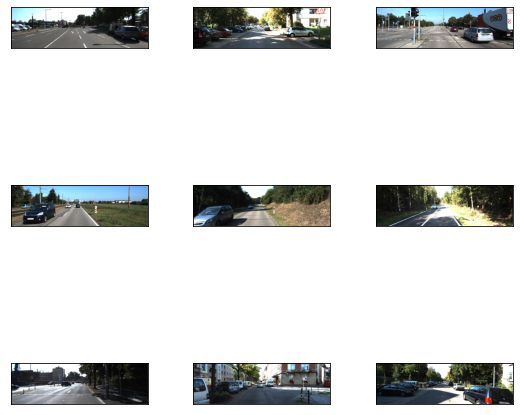

In [7]:
fig = tfds.show_examples(ds_train, ds_info)

In [8]:
ds_info

tfds.core.DatasetInfo(
    name='kitti',
    version=3.2.0,
    description='Kitti contains a suite of vision tasks built using an autonomous driving
platform. The full benchmark contains many tasks such as stereo, optical flow,
visual odometry, etc. This dataset contains the object detection dataset,
including the monocular images and bounding boxes. The dataset contains 7481
training images annotated with 3D bounding boxes. A full description of the
annotations can be found in the readme of the object development kit readme on
the Kitti homepage.',
    homepage='http://www.cvlibs.net/datasets/kitti/',
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/file_name': Text(shape=(), dtype=tf.string),
        'objects': Sequence({
            'alpha': tf.float32,
            'bbox': BBoxFeature(shape=(4,), dtype=tf.float32),
            'dimensions': Tensor(shape=(3,), dtype=tf.float32),
            'location': Tensor(shape=(3,), dtype

In [9]:
TakeDataset = ds_train.take(1)

--Example--
['image', 'image/file_name', 'objects']
--objects--
{'alpha': <tf.Tensor: shape=(3,), dtype=float32, numpy=array([ 1.98, -1.66, -2.22], dtype=float32)>, 'bbox': <tf.Tensor: shape=(3, 4), dtype=float32, numpy=
array([[0.00266667, 0.03444444, 1.        , 0.32736716],
       [0.26266667, 0.50450885, 0.5376533 , 0.596876  ],
       [0.28824   , 0.4908132 , 0.564     , 0.52033013]], dtype=float32)>, 'dimensions': <tf.Tensor: shape=(3, 3), dtype=float32, numpy=
array([[3.25, 2.15, 7.05],
       [1.46, 1.53, 3.17],
       [1.68, 0.5 , 0.42]], dtype=float32)>, 'location': <tf.Tensor: shape=(3, 3), dtype=float32, numpy=
array([[-3.82,  1.69,  6.96],
       [ 1.05,  1.49, 11.91],
       [ 0.2 ,  1.53, 12.03]], dtype=float32)>, 'occluded': <tf.Tensor: shape=(3,), dtype=int64, numpy=array([0, 1, 1])>, 'rotation_y': <tf.Tensor: shape=(3,), dtype=float32, numpy=array([ 1.49, -1.58, -2.21], dtype=float32)>, 'truncated': <tf.Tensor: shape=(3,), dtype=float32, numpy=array([0.75, 0.  , 0.  ]

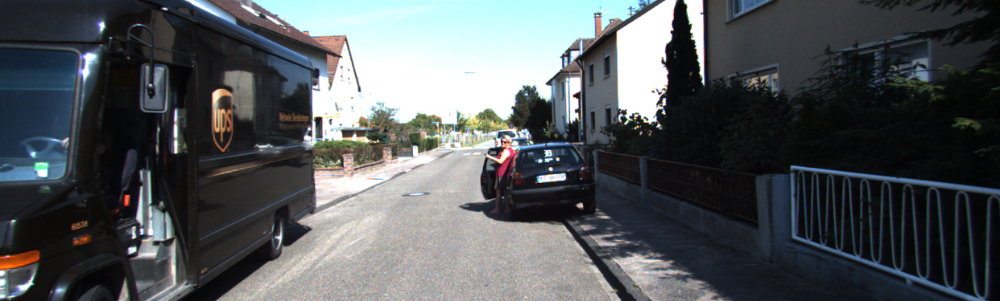

In [10]:
for example in TakeDataset:  
    print('--Example--')
    print(list(example.keys())) # example is `{'image': tf.Tensor, 'label': tf.Tensor}`
    image = example["image"]
    filename = example["image/file_name"].numpy().decode('utf-8')
    objects = example["objects"]

print('--objects--')
print(objects)
img = Image.fromarray(image.numpy())
img

```
데이터셋 이해를 위한 예시
Values    Name      Description
----------------------------------------------------------------------------
   1    type         Describes the type of object: 'Car', 'Van', 'Truck',
                     'Pedestrian', 'Person_sitting', 'Cyclist', 'Tram',
                     'Misc' or 'DontCare'
   1    truncated    Float from 0 (non-truncated) to 1 (truncated), where
                     truncated refers to the object leaving image boundaries
   1    occluded     Integer (0,1,2,3) indicating occlusion state:
                     0 = fully visible, 1 = partly occluded
                     2 = largely occluded, 3 = unknown
   1    alpha        Observation angle of object, ranging [-pi..pi]
   4    bbox         2D bounding box of object in the image (0-based index):
                     contains left, top, right, bottom pixel coordinates
   3    dimensions   3D object dimensions: height, width, length (in meters)
   3    location     3D object location x,y,z in camera coordinates (in meters)
   1    rotation_y   Rotation ry around Y-axis in camera coordinates [-pi..pi]
   1    score        Only for results: Float, indicating confidence in
                     detection, needed for p/r curves, higher is better.
```

<PIL.Image.Image image mode=RGB size=1242x375 at 0x7FB3EC059510>


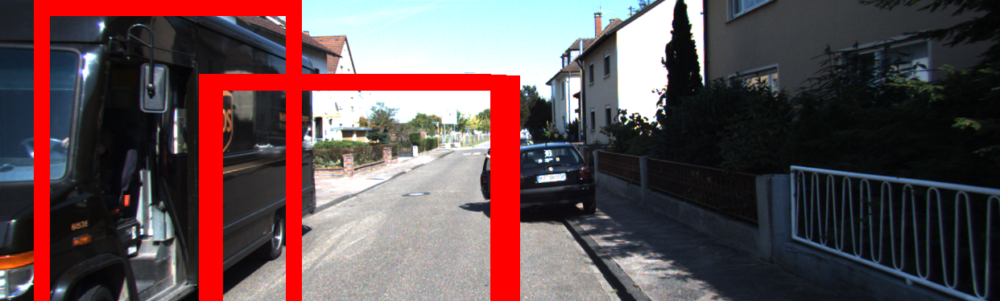

In [11]:
# 이미지 위에 바운딩 박스를 그려 화면에 표시해 주세요.
def visualize_bbox(input_image, object_bbox):
    input_image = copy.deepcopy(input_image)
    draw = ImageDraw.Draw(input_image)

    # 바운딩 박스 좌표(x_min, x_max, y_min, y_max) 구하기
    # [[YOUR CODE]]
    
    for cord in object_bbox:
        cord[1] *=input_image.size[0]
        cord[3] *=input_image.size[0]
        cord[0] = input_image.size[1] - cord[0]*input_image.size[1]
        cord[2] *=input_image.size[1] - cord[2]*input_image.size[1]
        
        draw.rectangle((cord[1], cord[3], cord[0], cord[2]), outline=(255,0,0),width=20)

    # 바운딩 박스 그리기
    # [[YOUR CODE]]
    print(input_image)
    return input_image

visualize_bbox(img, objects['bbox'].numpy())

In [12]:
img.size

(1242, 375)

1242 375
(3, 4)
[[ 42.78    374.      406.59      0.     ]
 [626.6     276.5     741.32    173.38   ]
 [609.58997 266.91    646.25    163.5    ]]
[ 42.78 374.   406.59   0.  ]
[626.6  276.5  741.32 173.38]
[609.58997 266.91    646.25    163.5    ]
<PIL.Image.Image image mode=RGB size=1242x375 at 0x7FB3EC059E90>


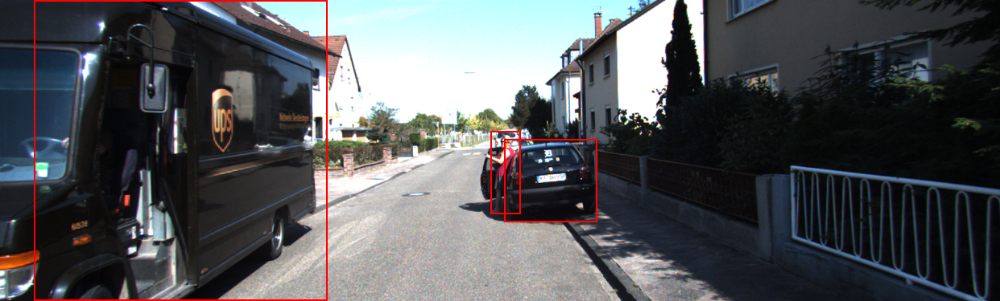

In [13]:
def visualize_bbox(input_image, object_bbox):
    input_image = copy.deepcopy(input_image)
    draw = ImageDraw.Draw(input_image)

        # 바운딩 박스 좌표(x_min, x_max, y_min, y_max) 구하기
    width, height = img.size
    print(width, height)
    print(object_bbox.shape)
    x_min = object_bbox[:,1] * width
    x_max = object_bbox[:,3] * width
    y_min = height - object_bbox[:,0] * height
    y_max = height - object_bbox[:,2] * height

        # 바운딩 박스 그리기
    rects = np.stack([x_min, y_min, x_max, y_max], axis=1)
    print(rects)
    for _rect in rects:
        print(_rect)
        draw.rectangle(_rect, outline=(255,0,0), width=2)
    print(input_image)
    return input_image

visualize_bbox(img, objects['bbox'].numpy())

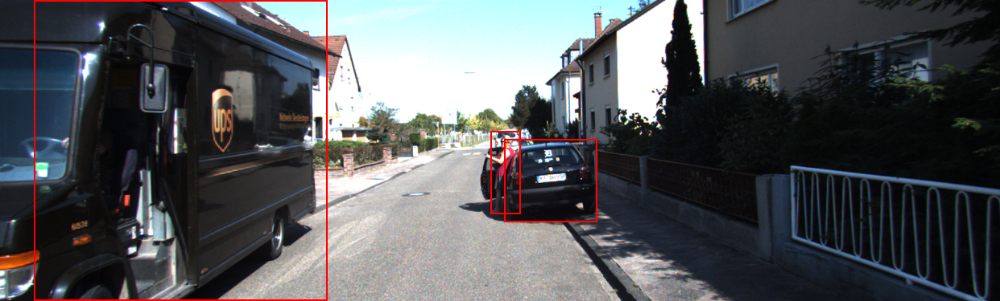

In [14]:
def visualize_bbox(input_image, object_bbox):
    input_image = copy.deepcopy(input_image)
    draw = ImageDraw.Draw(input_image)

        # 바운딩 박스 좌표(x_min, x_max, y_min, y_max) 구하기
    width, height = img.size
        # 바운딩 박스 그리기
    for cord in object_bbox:
        cord[1] *= width
        cord[3] *= width
        cord[0] = height - cord[0]*height
        cord[2] = height - cord[2]*height
        draw.rectangle((cord[1],cord[0],cord[3],cord[2]), outline=(255,0,0), width=2)
    return input_image

visualize_bbox(img, objects['bbox'].numpy())

In [16]:
import os
data_dir = os.getenv('HOME')+'/aiffel/object_detection/data'
img_dir = os.getenv('HOME')+'/kitti_images'
train_csv_path = data_dir + '/kitti_train.csv'

# parse_dataset 함수를 구현해 주세요.
def parse_dataset(dataset, img_dir="kitti_images", total=0):
    if not os.path.exists(img_dir):
        os.mkdir(img_dir)
    # Dataset의 claas를 확인하여 class에 따른 index를 확인해둡니다.
    # 저는 기존의 class를 차와 사람으로 나누었습니다.
    type_class_map = {
        0: "car",
        1: "car",
        2: "car",
        3: "person",
        4: "person",
        5: "person",
    }
    # Keras retinanet을 학습하기 위한 dataset을 csv로 parsing하기 위해서 필요한 column을 가진 pandas.DataFrame을 생성합니다.
    df = pd.DataFrame(columns=["img_path", "x1", "y1", "x2", "y2", "class_name"])
    for item in tqdm(dataset, total=total):
        filename = item['image/file_name'].numpy().decode('utf-8')
        img_path = os.path.join(img_dir, filename)

        img = Image.fromarray(item['image'].numpy())
        img.save(img_path)
        object_bbox = item['objects']['bbox']
        object_type = item['objects']['type'].numpy()
        width, height = img.size

        # tf.dataset의 bbox좌표가 0과 1사이로 normalize된 좌표이므로 이를 pixel좌표로 변환합니다.
        x_min = object_bbox[:,1] * width
        x_max = object_bbox[:,3] * width
        y_min = height - object_bbox[:,2] * height
        y_max = height - object_bbox[:,0] * height

        # 한 이미지에 있는 여러 Object들을 한 줄씩 pandas.DataFrame에 append합니다.
        rects = np.stack([x_min, y_min, x_max, y_max], axis=1).astype(np.int)
        for i, _rect in enumerate(rects):
            _type = object_type[i]
            if _type not in type_class_map.keys():
                continue
            df = df.append({
                "img_path": img_path,
                "x1": _rect[0],
                "y1": _rect[1],
                "x2": _rect[2],
                "y2": _rect[3],
                "class_name": type_class_map[_type]
            }, ignore_index=True)
            break
    return df

df_train = parse_dataset(ds_train, img_dir, total=ds_info.splits['train'].num_examples)
df_train.to_csv(train_csv_path, sep=',',index = False, header=False)

100%|██████████| 6347/6347 [11:30<00:00,  9.19it/s]


In [ ]:
test_csv_path = data_dir + '/kitti_test.csv'

df_test = parse_dataset(ds_test, img_dir, total=ds_info.splits['test'].num_examples)
df_test.to_csv(test_csv_path, sep=',',index = False, header=False)

In [19]:
class_txt_path = data_dir + '/classes.txt'

def save_class_format(path="./classes.txt"):
    class_type_map = {
        "car" : 0,
        "person": 1
    }
    with open(path, mode='w', encoding='utf-8') as f:
        for k, v in class_type_map.items():
            f.write(f"{k},{v}\n")

save_class_format(class_txt_path)

In [19]:
# RetinaNet 훈련이 시작됩니다!! 50epoch 훈련에 1시간 이상 소요될 수 있습니다. 
!python ~/aiffel/object_detection/keras-retinanet/keras_retinanet/bin/train.py --gpu 0 --multiprocessing --workers 4 --batch-size 2 --epochs 20 --steps 195 csv ~/aiffel/object_detection/data/kitti_train.csv ~/aiffel/object_detection/data/classes.txt

2020-10-22 16:46:01.058648: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-10-22 16:46:02.321116: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-10-22 16:46:02.326480: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-10-22 16:46:02.326923: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: GeForce RTX 2070 computeCapability: 7.5
coreClock: 1.455GHz coreCount: 36 deviceMemorySize: 7.79GiB deviceMemoryBandwidth: 327.88GiB/s
2020-10-22 16:46:02.326943: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-10-22 16:46:02.327988: I tensorflow/stream_executor/platform

bn4b_branch2c (BatchNormalizati (None, None, None, 1 4096        res4b_branch2c[0][0]             
__________________________________________________________________________________________________
res4b (Add)                     (None, None, None, 1 0           bn4b_branch2c[0][0]              
                                                                 res4a_relu[0][0]                 
__________________________________________________________________________________________________
res4b_relu (Activation)         (None, None, None, 1 0           res4b[0][0]                      
__________________________________________________________________________________________________
res4c_branch2a (Conv2D)         (None, None, None, 2 262144      res4b_relu[0][0]                 
__________________________________________________________________________________________________
bn4c_branch2a (BatchNormalizati (None, None, None, 2 1024        res4c_branch2a[0][0]             
__________

Epoch 1/20
2020-10-22 16:46:11.257270: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudnn.so.7
2020-10-22 16:46:12.031284: W tensorflow/stream_executor/gpu/asm_compiler.cc:81] Running ptxas --version returned 256
2020-10-22 16:46:12.077898: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: ptxas exited with non-zero error code 256, output: 
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2020-10-22 16:46:12.469884: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2020-10-22 16:46:21.253844: I tensorflow/stream_executor/cuda/cuda_driver.cc:775] failed to allocate 2.38G (2552793600 bytes) from device: CUDA_ERROR_OUT_OF_MEMORY: out of memory
2020-10-22 16:46:21.253933: W tensorflow/core/common_runtime/bfc_allocator.cc:246] Allocator (GPU_0_bfc) ran out of memory trying

195/195 [==============================] - ETA: 0s - loss: 1.7202 - regression_loss: 1.3666 - classification_loss: 0.3536
Epoch 00008: saving model to ./snapshots/resnet50_csv_08.h5
195/195 [==============================] - 62s 320ms/step - loss: 1.7202 - regression_loss: 1.3666 - classification_loss: 0.3536
Epoch 9/20
195/195 [==============================] - ETA: 0s - loss: 1.7026 - regression_loss: 1.3504 - classification_loss: 0.3521
Epoch 00009: saving model to ./snapshots/resnet50_csv_09.h5
195/195 [==============================] - 62s 319ms/step - loss: 1.7026 - regression_loss: 1.3504 - classification_loss: 0.3521
Epoch 10/20
195/195 [==============================] - ETA: 0s - loss: 1.5853 - regression_loss: 1.2265 - classification_loss: 0.3588
Epoch 00010: saving model to ./snapshots/resnet50_csv_10.h5
195/195 [==============================] - 62s 319ms/step - loss: 1.5853 - regression_loss: 1.2265 - classification_loss: 0.3588
Epoch 11/20
195/195 [=======================

In [29]:
!python ~/aiffel/object_detection/keras-retinanet/keras_retinanet/bin/convert_model.py ./snapshots/resnet50_csv_20.h5 ./snapshots/resnet50_csv_20_infer.h5

2020-10-22 17:26:51.482179: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-10-22 17:26:52.406314: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-10-22 17:26:52.410467: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-10-22 17:26:52.410969: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: GeForce RTX 2070 computeCapability: 7.5
coreClock: 1.455GHz coreCount: 36 deviceMemorySize: 7.79GiB deviceMemoryBandwidth: 327.88GiB/s
2020-10-22 17:26:52.411010: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-10-22 17:26:52.411977: I tensorflow/stream_executor/platform

```
$ mkdir -p ~/aiffel/object_detection/test_set
$ wget https://aiffelstaticprd.blob.core.windows.net/media/documents/test_set.zip
$ mv test_set.zip ~/aiffel/object_detection/test_set
$ cd ~/aiffel/object_detection/test_set && unzip test_set.zip
```

In [30]:
%matplotlib inline

# automatically reload modules when they have changed
%load_ext autoreload
%autoreload 2

# import keras
import keras

# import keras_retinanet
from keras_retinanet import models
from keras_retinanet.models import load_model
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color
from keras_retinanet.utils.gpu import setup_gpu

# import miscellaneous modules
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
import time

gpu = '0'
setup_gpu(gpu)

model_path = os.path.join('.', 'snapshots', 'resnet50_csv_20_infer.h5')
model = load_model(model_path, backbone_name='resnet50')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Physical devices cannot be modified after being initialized
1 Physical GPUs, 1 Logical GPUs


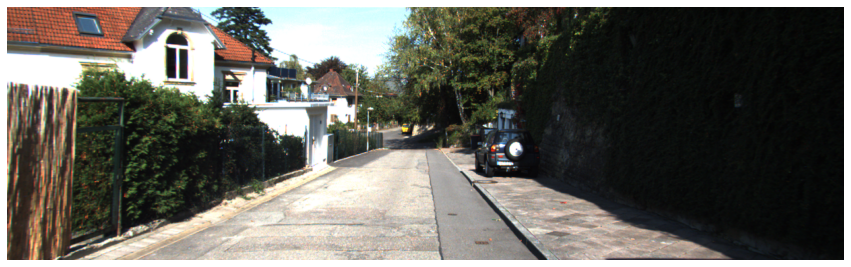

'Go'

In [70]:
import os
img_path = os.getenv('HOME')+'/aiffel/object_detection/test_set/go_4.png'

# inference_on_image 함수를 구현해 주세요.
def inference_on_image(model, img_path="./test_set/go_1.png", visualize=True):
    image = read_image_bgr(img_path)

    # copy to draw on
    draw = image.copy()
    draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

    color_map = {
        0: (0, 0, 255), # blue
        1: (255, 0, 0) # red
    }

    # preprocess image for network
    image = preprocess_image(image)
    image, scale = resize_image(image)

    # process image
    boxes, scores, labels = model.predict_on_batch(np.expand_dims(image, axis=0))

    # correct for image scale
    boxes /= scale
    
    
    judge='Go'
    # display images
    if  visualize:
        for box, score, label in zip(boxes[0], scores[0], labels[0]):
            if score < 0.5:
                break
            print(box)
            b = box.astype(int)
            draw_box(draw, b, color=color_map[label])
            caption = "{:.3f}".format(score)
            draw_caption(draw, b, caption)
            
            if label==0:
                car_width =box[2]-box[0]
                car_height=box[3]-box[1]
                if car_width >=300 or car_height>=300:
                    judge='Stop' 
                
            elif label ==1:
                judge='Stop'
            
        plt.figure(figsize=(15, 15))
        plt.axis('off')
        plt.imshow(draw)
        plt.show()
        return judge

inference_on_image(model, img_path=img_path)

[770.79236 144.22095 844.98035 316.37   ]


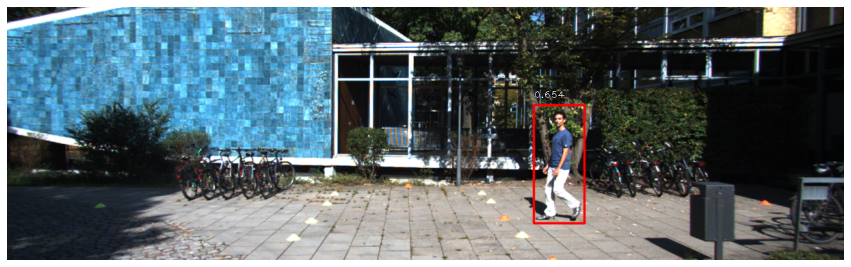

'Stop'

In [71]:
img_path = os.getenv('HOME')+'/aiffel/object_detection/test_set/stop_1.png'
inference_on_image(model, img_path=img_path)

## 1. 자율주행 시스템 만들기
위에서 만든 모델을 통해 아래의 조건을 만족하는 함수를 만들어 주세요.

입력으로 이미지 경로를 받습니다.
정지조건에 맞는 경우 "Stop" 아닌 경우 "Go"를 반환합니다.
조건은 다음과 같습니다.
사람이 한 명 이상 있는 경우
차량의 크기(width or height)가 300px이상인 경우

[770.79236 144.22095 844.98035 316.37   ]


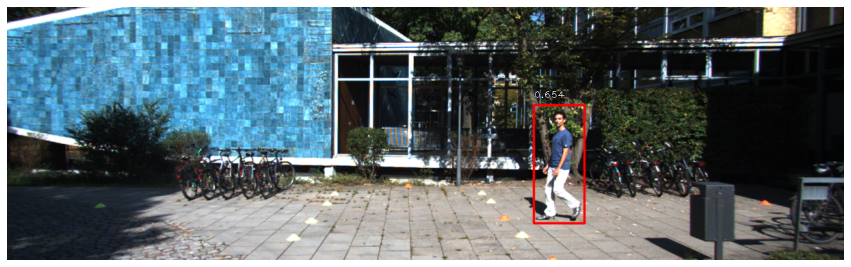

Stop


In [72]:
img_path = os.getenv('HOME')+'/aiffel/object_detection/test_set/stop_1.png'

def self_drive_assist(img_path, size_limit=300):
    # 코드 구현
        # 정지조건에 맞으면 return "Stop"
        # 아닌 경우 return "Go"
    return inference_on_image(model,img_path=img_path)
    
        
    

print(self_drive_assist(img_path))    

## 2. 자율주행 시스템 평가하기

[770.79236 144.22095 844.98035 316.37   ]


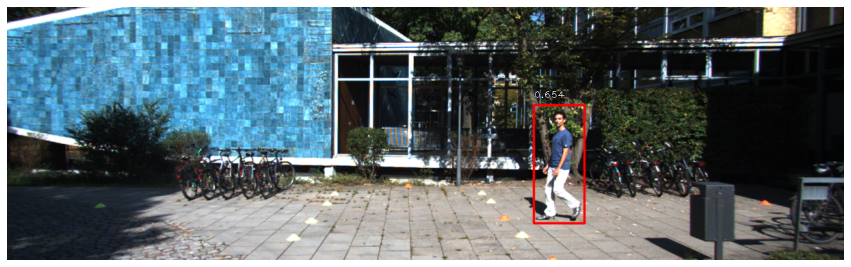

Stop
[416.40054 156.41827 492.72083 326.09808]


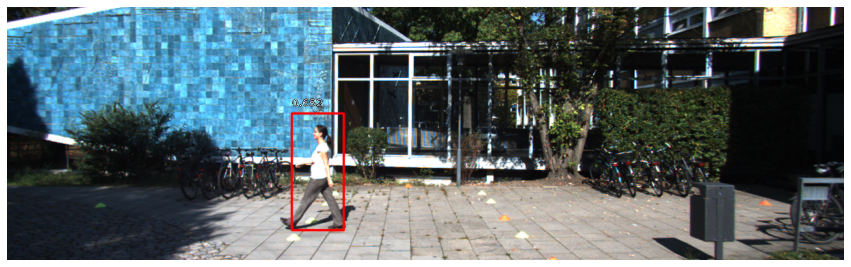

Stop
[  0.      198.47124 314.5344  369.12827]


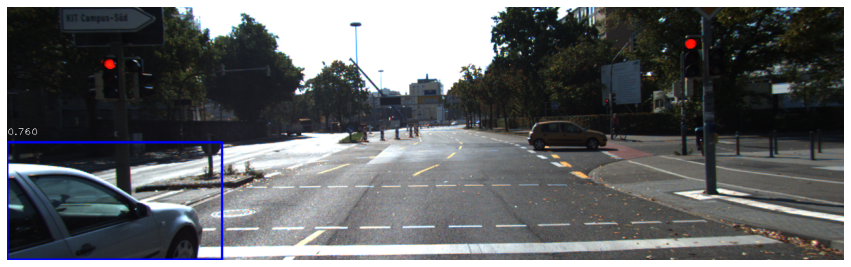

Stop
[ 734.50757    35.965935 1116.4723    364.82278 ]


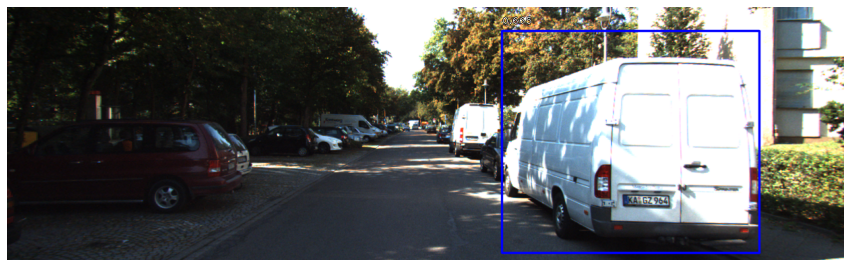

Stop
[ 870.06903  173.01279 1239.2114   373.6249 ]


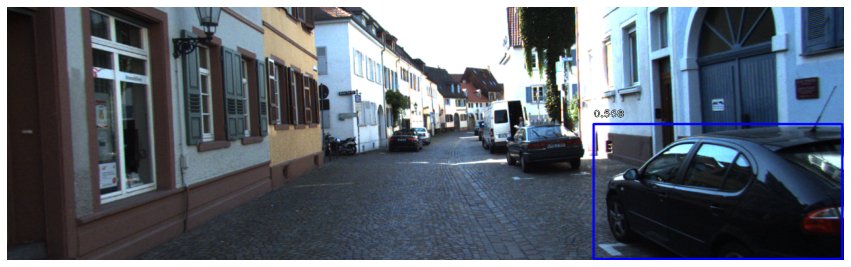

Stop
[593.9163  175.9137  624.8394  204.36125]


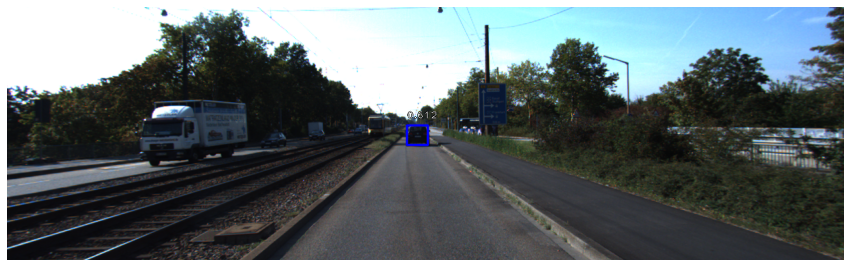

Go
[627.3698  172.72758 667.2569  213.21194]


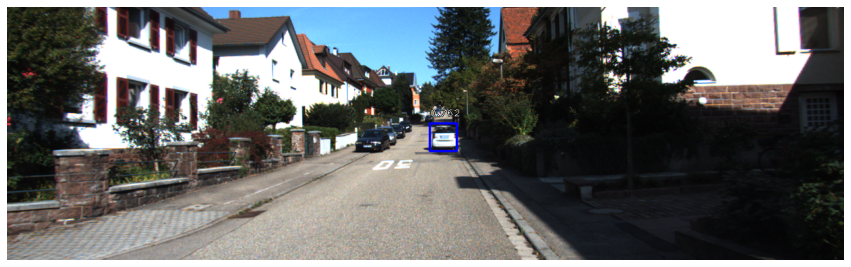

Go


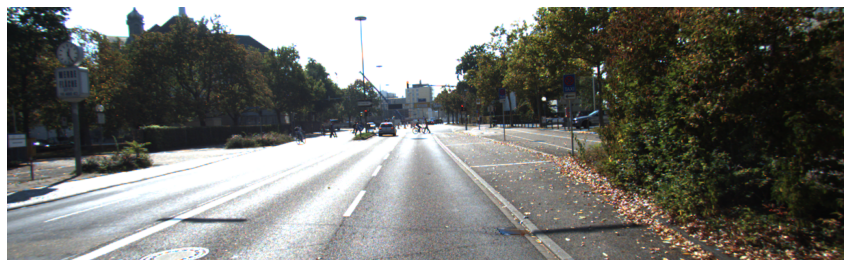

Go


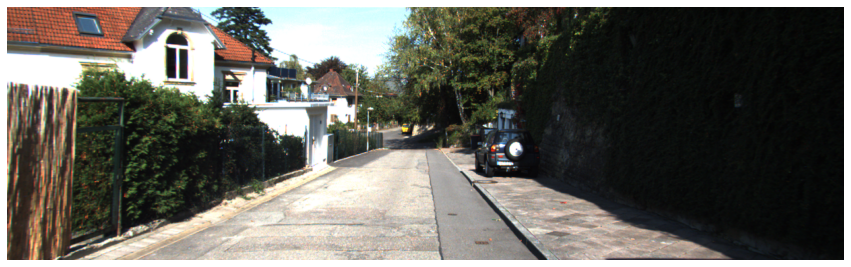

Go


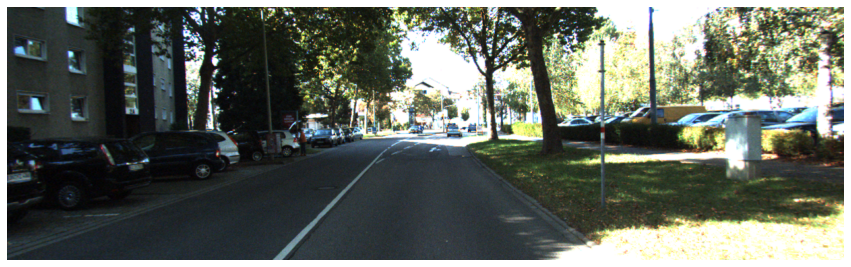

Go
100점입니다.


In [73]:
import os

def test_system(func):
    work_dir = os.getenv('HOME')+'/aiffel/object_detection'
    score = 0
    test_set=[
        ("test_set/stop_1.png", "Stop"),
        ("test_set/stop_2.png", "Stop"),
        ("test_set/stop_3.png", "Stop"),
        ("test_set/stop_4.png", "Stop"),
        ("test_set/stop_5.png", "Stop"),
        ("test_set/go_1.png", "Go"),
        ("test_set/go_2.png", "Go"),
        ("test_set/go_3.png", "Go"),
        ("test_set/go_4.png", "Go"),
        ("test_set/go_5.png", "Go"),
    ]

    for image_file, answer in test_set:
        image_path = work_dir + '/' + image_file
        pred = func(image_path)
        print(pred)
        if pred == answer:
            score += 10
    print(f"{score}점입니다.")

test_system(self_drive_assist)